# 1.16d: Comoving Frame Displacement

**Goal:** Factor out bulk motion by centering on the untrained token centroid at each timestep.

## The Comoving Frame

At each timestep $t$:
1. Compute untrained centroid: $\mathbf{c}_{\text{untrained}}(t)$
2. Transform all positions: $\mathbf{W}'_i(t) = \mathbf{W}_i(t) - \mathbf{c}_{\text{untrained}}(t)$

In this frame:
- **Untrained tokens cluster near origin** (by construction, their centroid is always at zero)
- **Trained tokens escape outward** (their displacement from origin grows over time)
- **Global jitter is removed** (bulk motion shared by all tokens gets factored out)

## The Spacetime Diagram

**X-axis:** Net displacement from comoving origin
- $d_i(t) = \|\mathbf{W}'_i(t) - \mathbf{W}'_i(0)\|$
- Start at x=0 (all tokens at their initial positions in comoving frame)
- Move rightward as tokens escape

**Y-axis:** Training step (time)

**Expected result:**
- Thick blurry vertical line near x=0 (untrained tokens jittering in place)
- Spreading fan of worldlines (trained tokens breaking away and escaping)

## Parameters

In [25]:
# Training data
TRAINING_DATA_PATH = "../tensors/Flannel/1.20a_flannel_1.safetensors"
TOKEN_MASK_PATH = "../tensors/Flannel/live_dead_tokens.safetensors"

# Visualization
PLOT_DPI = 200
ALPHA = 0.05
LINEWIDTH = 0.5
FIGSIZE = (16, 10)

## Imports

In [26]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from safetensors.torch import load_file

print("✓ Imports complete")

✓ Imports complete


## Load Data

In [27]:
print("Loading training data...\n")

# Training data
data = load_file(TRAINING_DATA_PATH)
embeddings = data['embeddings'].float()  # (n_steps, vocab_size, hidden_dim)
n_steps, vocab_size, hidden_dim = embeddings.shape

# Token masks
mask_data = load_file(TOKEN_MASK_PATH)
trained_indices = mask_data['live_indices']
untrained_indices = mask_data['dead_indices']

n_trained = len(trained_indices)
n_untrained = len(untrained_indices)

print(f"✓ Loaded data")
print(f"  Steps: {n_steps}")
print(f"  Vocab: {vocab_size:,} ({n_trained:,} trained, {n_untrained:,} untrained)")
print(f"  Hidden dim: {hidden_dim}")

Loading training data...

✓ Loaded data
  Steps: 1001
  Vocab: 10,000 (6,301 trained, 3,699 untrained)
  Hidden dim: 64


## Transform to Comoving Frame

Center on untrained centroid at each timestep.

In [28]:
print("\nTransforming to comoving frame...\n")

# Compute untrained centroid at each timestep
untrained_centroids = embeddings[:, untrained_indices, :].mean(dim=1)  # (n_steps, hidden_dim)

print(f"Untrained centroid trajectory:")
print(f"  Initial norm: {torch.norm(untrained_centroids[0]).item():.6f}")
print(f"  Final norm: {torch.norm(untrained_centroids[-1]).item():.6f}")
print(f"  Total drift: {torch.norm(untrained_centroids[-1] - untrained_centroids[0]).item():.6f}")
print()

# Transform all embeddings to comoving frame
# Subtract untrained centroid from all tokens at each timestep
embeddings_comoving = embeddings - untrained_centroids.unsqueeze(1)  # (n_steps, vocab_size, hidden_dim)

print(f"✓ Transformed to comoving frame")
print(f"  Shape: {embeddings_comoving.shape}")

# Verify: untrained centroid in comoving frame should be zero
untrained_centroid_check = embeddings_comoving[:, untrained_indices, :].mean(dim=1)
print(f"  Untrained centroid in comoving frame (should be ~0): {torch.norm(untrained_centroid_check).item():.6e}")


Transforming to comoving frame...

Untrained centroid trajectory:
  Initial norm: 0.002689
  Final norm: 0.500136
  Total drift: 0.500009

✓ Transformed to comoving frame
  Shape: torch.Size([1001, 10000, 64])
  Untrained centroid in comoving frame (should be ~0): 4.932886e-07


## Compute Net Displacement from Comoving Origin

In [29]:
print("\nComputing net displacement from comoving origin...\n")

# Initial positions in comoving frame (t=0)
initial_positions = embeddings_comoving[0]  # (vocab_size, hidden_dim)

# Net displacement from initial position at each timestep
net_displacement = torch.zeros(n_steps, vocab_size)

for t in range(n_steps):
    # Distance from initial position
    displacement_vectors = embeddings_comoving[t] - initial_positions  # (vocab_size, hidden_dim)
    net_displacement[t] = torch.norm(displacement_vectors, p=2, dim=1)  # (vocab_size,)

print(f"✓ Computed net displacement")
print(f"  Shape: {net_displacement.shape}")
print(f"  Max final displacement: {net_displacement[-1].max().item():.6f}")
print(f"  Mean final displacement: {net_displacement[-1].mean().item():.6f}")


Computing net displacement from comoving origin...

✓ Computed net displacement
  Shape: torch.Size([1001, 10000])
  Max final displacement: 1.115423
  Mean final displacement: 0.268751


## Extract Trained and Untrained Displacements

In [30]:
# Trained tokens
trained_displacements = net_displacement[:, trained_indices]  # (n_steps, n_trained)

# Untrained tokens
untrained_displacements = net_displacement[:, untrained_indices]  # (n_steps, n_untrained)

print(f"\nTrained tokens (comoving frame):")
print(f"  Final displacements: mean={trained_displacements[-1].mean().item():.6f}, max={trained_displacements[-1].max().item():.6f}")

print(f"\nUntrained tokens (comoving frame):")
print(f"  Final displacements: mean={untrained_displacements[-1].mean().item():.6f}, max={untrained_displacements[-1].max().item():.6f}")


Trained tokens (comoving frame):
  Final displacements: mean=0.386045, max=1.115423

Untrained tokens (comoving frame):
  Final displacements: mean=0.068949, max=0.115163


## Spacetime Diagram 1: All Tokens (Comoving Frame)

**Expected:** Vertical cluster near x=0 (untrained) + spreading fan (trained)


Plotting comoving spacetime diagram: ALL TOKENS (10,000 worldlines)...

  Plotted 5,000 / 10,000 worldlines...
  Plotted 10,000 / 10,000 worldlines...


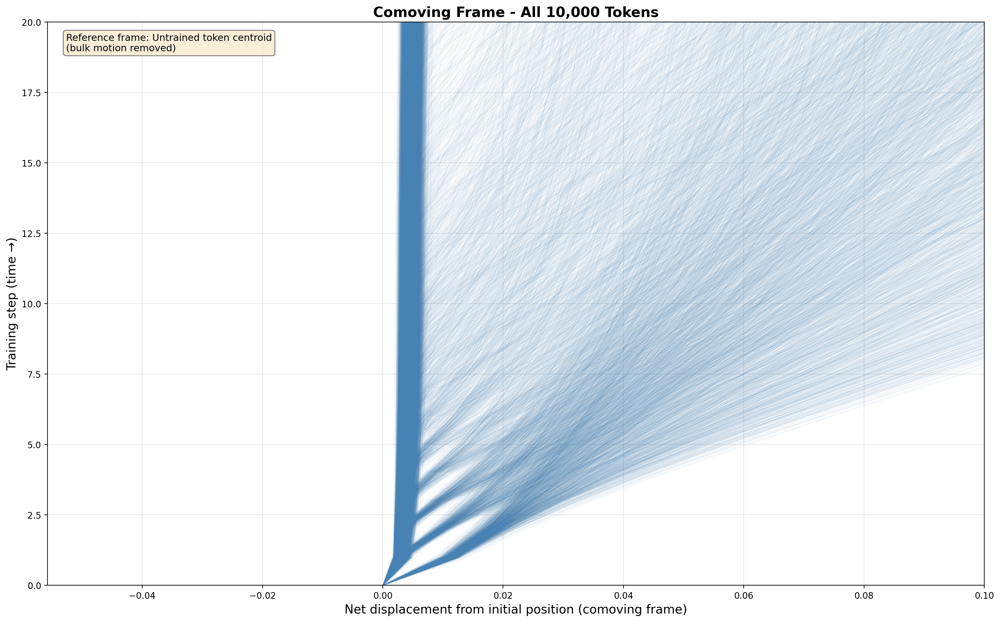


✓ All tokens comoving diagram complete


In [31]:
print(f"\nPlotting comoving spacetime diagram: ALL TOKENS ({vocab_size:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

timesteps = np.arange(n_steps)

# Plot every token worldline
for i in range(vocab_size):
    ax.plot(net_displacement[:, i].numpy(), timesteps, 
            color='steelblue', alpha=ALPHA, linewidth=LINEWIDTH)
    
    if (i + 1) % 5000 == 0:
        print(f"  Plotted {i+1:,} / {vocab_size:,} worldlines...")

ax.set_xlabel('Net displacement from initial position (comoving frame)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Comoving Frame - All {vocab_size:,} Tokens', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(right=0.1)
ax.set_ylim(0, 20)

# Add annotation
ax.text(0.02, 0.98, 'Reference frame: Untrained token centroid\n(bulk motion removed)', 
        transform=ax.transAxes, fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"\n✓ All tokens comoving diagram complete")

## Spacetime Diagram 2: Untrained Tokens (Comoving Frame)

**Expected:** Tight vertical bundle near x=0 (jittering in place)


Plotting comoving spacetime diagram: UNTRAINED TOKENS (3,699 worldlines)...

  Plotted 2,000 / 3,699 worldlines...


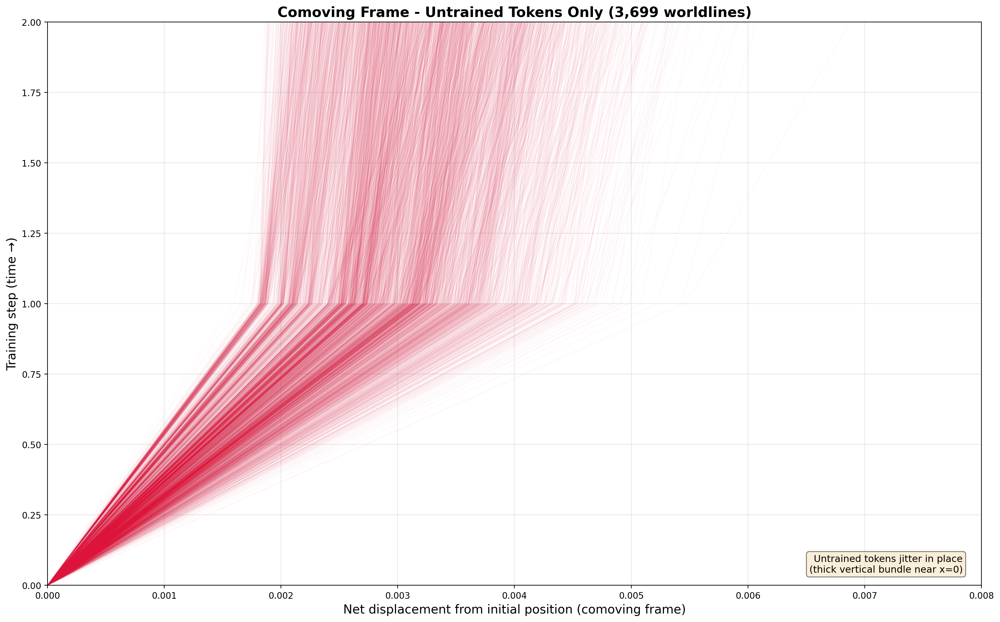


✓ Untrained tokens comoving diagram complete


In [56]:
print(f"\nPlotting comoving spacetime diagram: UNTRAINED TOKENS ({n_untrained:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

# Plot untrained token worldlines
for i in range(n_untrained):
    ax.plot(untrained_displacements[:, i].numpy(), timesteps, 
            color='crimson', alpha=ALPHA, linewidth=LINEWIDTH)
    
    if (i + 1) % 2000 == 0:
        print(f"  Plotted {i+1:,} / {n_untrained:,} worldlines...")

ax.set_xlabel('Net displacement from initial position (comoving frame)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Comoving Frame - Untrained Tokens Only ({n_untrained:,} worldlines)', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0, right=0.008)
ax.set_ylim(bottom=0, top=2)

# Add annotation
ax.text(0.98, 0.02, 'Untrained tokens jitter in place\n(thick vertical bundle near x=0)', 
        transform=ax.transAxes, fontsize=11, verticalalignment='bottom', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"\n✓ Untrained tokens comoving diagram complete")

## Spacetime Diagram 3: Trained Tokens (Comoving Frame)

**Expected:** Clean breakaway—worldlines starting near x=0, spreading rightward


Plotting comoving spacetime diagram: TRAINED TOKENS (6,301 worldlines)...

  Plotted 5,000 / 6,301 worldlines...


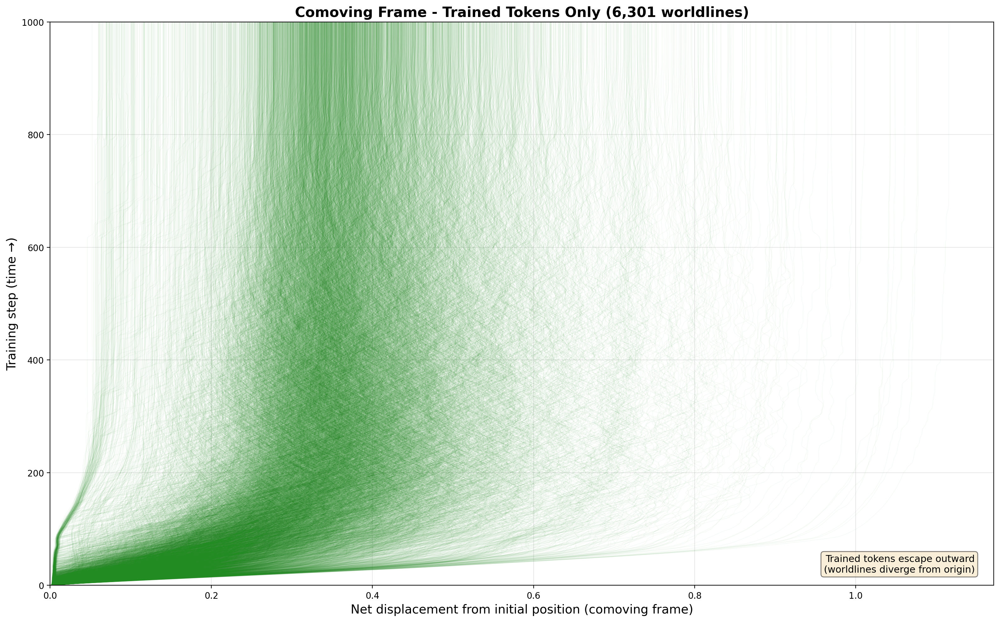


✓ Trained tokens comoving diagram complete


In [57]:
print(f"\nPlotting comoving spacetime diagram: TRAINED TOKENS ({n_trained:,} worldlines)...\n")

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=PLOT_DPI)

# Plot trained token worldlines
for i in range(n_trained):
    ax.plot(trained_displacements[:, i].numpy(), timesteps, 
            color='forestgreen', alpha=ALPHA, linewidth=LINEWIDTH)
    
    if (i + 1) % 5000 == 0:
        print(f"  Plotted {i+1:,} / {n_trained:,} worldlines...")

ax.set_xlabel('Net displacement from initial position (comoving frame)', fontsize=14)
ax.set_ylabel('Training step (time →)', fontsize=14)
ax.set_title(f'Comoving Frame - Trained Tokens Only ({n_trained:,} worldlines)', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0)
ax.set_ylim(0, n_steps-1)

# Add annotation
ax.text(0.98, 0.02, 'Trained tokens escape outward\n(worldlines diverge from origin)', 
        transform=ax.transAxes, fontsize=11, verticalalignment='bottom', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"\n✓ Trained tokens comoving diagram complete")

## Summary Statistics

In [58]:
print(f"\n{'='*80}")
print(f"COMOVING FRAME DISPLACEMENT SUMMARY")
print(f"{'='*80}\n")

print(f"Dataset: {TRAINING_DATA_PATH}")
print(f"  Steps: {n_steps}")
print(f"  Tokens: {vocab_size:,} ({n_trained:,} trained, {n_untrained:,} untrained)")
print()

print(f"Reference frame: Untrained token centroid")
print(f"  (Bulk motion factored out)")
print()

print(f"Final net displacements (at t={n_steps-1}):")
print()

print(f"All tokens:")
all_final = net_displacement[-1]
print(f"  Mean: {all_final.mean().item():.6f}")
print(f"  Std: {all_final.std().item():.6f}")
print(f"  Range: [{all_final.min().item():.6f}, {all_final.max().item():.6f}]")
print()

print(f"Trained tokens:")
trained_final = trained_displacements[-1]
print(f"  Mean: {trained_final.mean().item():.6f}")
print(f"  Std: {trained_final.std().item():.6f}")
print(f"  Range: [{trained_final.min().item():.6f}, {trained_final.max().item():.6f}]")
print()

print(f"Untrained tokens:")
untrained_final = untrained_displacements[-1]
print(f"  Mean: {untrained_final.mean().item():.6f}")
print(f"  Std: {untrained_final.std().item():.6f}")
print(f"  Range: [{untrained_final.min().item():.6f}, {untrained_final.max().item():.6f}]")
print()

# Separation ratio
ratio = trained_final.mean() / (untrained_final.mean() + 1e-10)
print(f"Separation (trained / untrained mean): {ratio:.1f}×")
print()

print(f"Interpretation:")
if untrained_final.mean() < 0.01:
    print(f"  ✓ Untrained tokens stay near origin (mean displacement {untrained_final.mean().item():.6f})")
    print(f"  ✓ Comoving frame successfully removes bulk motion")
else:
    print(f"  ⚠️  Untrained tokens drift significantly even in comoving frame")

if ratio > 10:
    print(f"  ✓ Clear separation: trained tokens escape {ratio:.1f}× farther")
    print(f"  ✓ Clean 'breakaway' pattern visible")
elif ratio > 2:
    print(f"  → Moderate separation ({ratio:.1f}×)")
else:
    print(f"  ⚠️  Weak separation between trained and untrained")

print(f"\n{'='*80}")


COMOVING FRAME DISPLACEMENT SUMMARY

Dataset: ../tensors/Flannel/1.20a_flannel_1.safetensors
  Steps: 1001
  Tokens: 10,000 (6,301 trained, 3,699 untrained)

Reference frame: Untrained token centroid
  (Bulk motion factored out)

Final net displacements (at t=1000):

All tokens:
  Mean: 0.268751
  Std: 0.184175
  Range: [0.040370, 1.115423]

Trained tokens:
  Mean: 0.386045
  Std: 0.128758
  Range: [0.052175, 1.115423]

Untrained tokens:
  Mean: 0.068949
  Std: 0.010011
  Range: [0.040370, 0.115163]

Separation (trained / untrained mean): 5.6×

Interpretation:
  ⚠️  Untrained tokens drift significantly even in comoving frame
  → Moderate separation (5.6×)

